## Práctica Vinos: Thrice Upon A Time

Equipo:

<ul>
    <li>Flor Melissa Vázquez Mateo</li>
    <li>Diego Alberto Chávez Prado</li>
    <li>Cesar Ricardo Altamirano Nava</li>
    <li>Erika Margarita Villalobos Martínez</li>
</ul>

#### Se importan bibliotecas necesarias

In [1]:
#General
import numpy as np
import pandas as pd
from skimpy import skim

#Estadisticas
from scipy import stats

#Graficas
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from pandas.plotting import andrews_curves
from pyod.models.auto_encoder import AutoEncoder

# KS test, ji-cuadrada
from scipy.stats import ks_2samp, chi2_contingency

# Valores atípicos
from pyod.models.iforest import IForest
from sklearn.decomposition import PCA

# Preprocesamiento
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder

#Modelo
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import root_mean_squared_error, r2_score, mean_absolute_error, mean_absolute_percentage_error
from sklearn.metrics import accuracy_score, recall_score, confusion_matrix, roc_auc_score, roc_curve
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

#Guardar modelo
from sklearn.pipeline import Pipeline
import joblib

#### Carga de datos

In [2]:
df = pd.read_csv(r"../data/winequality.csv")

In [3]:
df

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,type
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,red
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5,red
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5,red
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6,red
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5,red
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6492,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,white
6493,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,white
6494,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,white
6495,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,white


#### Funciones

In [4]:
#Definimos un objeto para graficar
class analyze:
    # Inicializamos la clase
    def __init__(self, df, target = ''):
        self.df = df
        self.target = target
        self.num_vars = df.select_dtypes(include=['number',]).columns.to_numpy()
        self.cat_vars = categoricas = df.select_dtypes(include=['object', 'category','bool','string']).columns.to_numpy()
        self.fecha_vars = df.select_dtypes(include=['datetime64']).columns.to_numpy()

    #Método para graficar variables numéricas
    def plot_num_reg(self):
        for var in self.num_vars:
            fig = make_subplots(rows=1, cols=2, subplot_titles=(f"{var} - Boxplot", f"{var} - Histograma"))

            # Boxplot
            fig.add_trace(
                go.Box(y=self.df[var], name="Boxplot", marker_color="#008080"),
                row=1, col=1
            )

            # Histograma
            fig.add_trace(
                go.Histogram(x=self.df[var], name="Histograma",
                             marker_color="#00a77d", nbinsx=50,
                             histnorm='probability density'),
                row=1, col=2
            )

            fig.update_layout(title_text=f"Variable: {var}", height=400, width=800)
            fig.show()

    def plot_num_class(self):
        for var in self.num_vars:
            # Actualizamos el título del subplot para reflejar que ahora es comparativo
            fig = make_subplots(rows=1, cols=2,
                                subplot_titles=(f"{var} por {self.target}", f"{var} - Histograma Global"))

            # Boxplot segmentado por target
            fig.add_trace(
                go.Box(
                    y=self.df[var],           # Variable numérica en el eje Y
                    x=self.df[self.target],   # Variable target en el eje X (crea la división)
                    name="Boxplot",
                    # He comentado el color fijo para que Plotly asigne colores distintos
                    # a cada clase si lo prefieres. Si quieres todos iguales, descoméntalo.
                    # marker_color="#008080"
                ),
                row=1, col=1
            )

            # Histograma (se mantiene global para ver la distribución total)
            fig.add_trace(
                go.Histogram(
                    x=self.df[var],
                    name="Histograma",
                    marker_color="#00a77d",
                    nbinsx=50,
                    histnorm='probability density'
                ),
                row=1, col=2
            )

            fig.update_layout(title_text=f"Análisis variable: {var}", height=400, width=900)
            fig.show()

    def plot_num_class_2(self):
        for var in self.num_vars:
            fig = make_subplots(rows=1, cols=2,
                                subplot_titles=(f"{var} por {self.target}", f"{var} Distribución por Target"))

            # --- 1. Boxplot (automático) ---
            # Al pasar 'x=target', plotly crea una caja para cada valor único
            fig.add_trace(
                go.Box(
                    y=self.df[var],
                    x=self.df[self.target], # Esto separa las cajas
                    name="Boxplot"
                ),
                row=1, col=1
            )

            # --- 2. Histograma (Iterativo) ---
            # Iteramos por cada valor del target para agregar su propio histograma
            for valor_target in self.df[self.target].unique():
                subset = self.df[self.df[self.target] == valor_target]

                fig.add_trace(
                    go.Histogram(
                        x=subset[var],
                        name=f"{self.target}: {valor_target}",
                        nbinsx=50,
                        histnorm='probability density',
                        opacity=0.6  # Transparencia para ver superposiciones
                    ),
                    row=1, col=2
                )

            # --- Configuración del Layout ---
            fig.update_layout(
                title_text=f"Análisis de: {var}",
                barmode='overlay', # IMPORTANTE: Permite que los histogramas se superpongan
                height=400,
                width=900
            )
            fig.show()

    #Método para graficar variables categóricas
    def plot_cat_reg(self):
        for var in self.cat_vars:
            value_counts = self.df[var].value_counts()
            labels = value_counts.index.astype(str)
            values = value_counts.values

            fig = go.Figure(
                data=[go.Pie(labels=labels, values=values, textinfo='percent+label')]
            )

            fig.update_layout(title_text=f"Variable: {var}", height=400, width=500)
            fig.show()

    def plot_cat_class(self):
        for var in self.cat_vars:
            # Calculamos la tabla de contingencia (Cruce de Variable vs Target)
            crosstab = pd.crosstab(self.df[var], self.df[self.target])

            fig = go.Figure()

            # Iteramos sobre cada valor único del target (las columnas del crosstab)
            for target_value in crosstab.columns:
                fig.add_trace(go.Bar(
                    x=crosstab.index.astype(str),  # Las categorías de la variable 'var'
                    y=crosstab[target_value],      # El conteo para este valor del target
                    name=f"{self.target}: {target_value}" # Etiqueta en la leyenda
                ))

            fig.update_layout(
                title_text=f"Distribución de {var} por {self.target}",
                # 'group' pone las barras una al lado de la otra.
                # Usa 'stack' si prefieres que estén una encima de otra.
                barmode='group',
                xaxis_title=var,
                yaxis_title="Conteo",
                height=400,
                width=800
            )
            fig.show()

    #Método para graficar la matriz de correlación de numéricas
    def corr_matrix(self):
        corr_matrix = self.df[self.num_vars].corr()

        fig = go.Figure(data=go.Heatmap(
            z=corr_matrix.values,
            x=corr_matrix.columns,
            y=corr_matrix.columns,
            colorscale='Viridis'))

        fig.update_layout(
            title='Matriz de Correlación',
            width=800,
            height=600
        )
        fig.show()

    #Curva de Andrews
    def andrews_curve_class(self):
        plt.figure(figsize=(12,8))
        df_andrews = self.df[self.num_vars].copy()
        df_andrews[self.target] = self.df[self.target]
        andrews_curves(df_andrews, self.target, colormap='rainbow', alpha=0.6)
        plt.title('Curvas de Andrews')
        plt.xlabel('t (función de Fourier)')
        plt.ylabel('Valor transformado')
        plt.grid(True, color='lightgray', linestyle='--', linewidth=0.5)
        plt.show()

    def andrews_curve_scaled_reg(self):
        df_aux = self.df.copy()

        #Escalamos solo las columnas numéricas
        numeric_cols = df_aux.select_dtypes(include=['float64', 'int64']).columns
        scaler = MinMaxScaler()
        df_aux[numeric_cols] = scaler.fit_transform(df_aux[numeric_cols])

        #Agregamos una categoría ficticia
        df_aux["dummy_class"] = ""

        plt.figure(figsize=(12,8))
        andrews_curves(df_aux, "dummy_class", colormap="viridis", alpha=0.2)
        plt.title("Curvas de Andrews")
        plt.xlabel("t (función de Fourier)")
        plt.ylabel("Valor transformado")
        plt.grid(True, color="lightgray", linestyle="--", linewidth=0.5)
        plt.show()

    def get_num(self):
        return self.num_vars

    def get_df(self):
        return self.df

In [5]:
def remove_outliers_iforest(df, n_estimators=100, contamination=0.05, max_samples='auto'):
    model = IForest(n_estimators=n_estimators, contamination=contamination, max_samples=max_samples)
    model.fit(df)
    preds = model.predict(df)
    return df[preds == 0]

In [6]:
def ks_cols(df1, df2, cols):
    f = lambda c: ks_2samp(df1[c].dropna(), df2[c].dropna())
    return pd.DataFrame([(c, f(c).statistic, f(c).pvalue) for c in cols],
                        columns=["col","ks","p"])

In [7]:
#Función para evaluación del rendimiento
def evaluate_model(model, X, y, dataset_name="Dataset"):
    y_pred_default = model.predict(X)
    y_proba = model.predict_proba(X)[:, 1]

    #Métricas con umbral 0.5
    acc = accuracy_score(y, y_pred_default)
    sens = recall_score(y, y_pred_default)
    cm = confusion_matrix(y, y_pred_default)
    spec = cm[0,0] / (cm[0,0] + cm[0,1])
    auc = roc_auc_score(y, y_proba)

    print(f"\n=== Resultados en {dataset_name} (umbral = 0.5) ===")
    print(f"Accuracy:      {acc:.4f}")
    print(f"Sensibilidad:  {sens:.4f}")
    print(f"Especificidad: {spec:.4f}")
    print(f"AUC:           {auc:.4f}")

    #Calibración con J de Youden
    fpr, tpr, thresholds = roc_curve(y, y_proba)
    specificity = 1 - fpr
    J = tpr + specificity - 1
    idx_opt = np.argmax(J)
    best_threshold = thresholds[idx_opt]

    print(f"\n--- Calibración Youden J ---")
    print(f"Umbral óptimo:          {best_threshold:.4f}")
    print(f"Sensibilidad óptima:    {tpr[idx_opt]:.4f}")
    print(f"Especificidad óptima:   {specificity[idx_opt]:.4f}")

    #Recalcular métricas con umbral óptimo
    y_pred_opt = (y_proba >= best_threshold).astype(int)
    acc_opt = accuracy_score(y, y_pred_opt)
    sens_opt = recall_score(y, y_pred_opt)
    cm_opt = confusion_matrix(y, y_pred_opt)
    spec_opt = cm_opt[0,0] / (cm_opt[0,0] + cm_opt[0,1])

    print(f"\n=== Resultados en {dataset_name} (umbral óptimo) ===")
    print(f"Accuracy:      {acc_opt:.4f}")
    print(f"Sensibilidad:  {sens_opt:.4f}")
    print(f"Especificidad: {spec_opt:.4f}")

    #Curva ROC con umbral óptimo
    plt.figure(figsize=(6,5))
    plt.plot(fpr, tpr, label=f"{dataset_name} (AUC={auc:.4f})", color='blue')
    plt.plot([0,1], [0,1], "k--")
    plt.scatter(fpr[idx_opt], tpr[idx_opt], color='red', label=f"Umbral óptimo={best_threshold:.3f}")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title(f"Curva ROC - {dataset_name}")
    plt.legend()
    plt.show()

## Vino tinto

In [ ]:
df_red = df[df["type"] == "red"].copy()

In [ ]:
#Vista rápida
skim(df_red)

In [ ]:
analisis_red = analyze(df_red, 'quality')

In [ ]:
analisis_red.plot_num_class()

In [ ]:
analisis_red.plot_cat_class()

In [ ]:
analisis_red.andrews_curve_class()

Se quitaron los outliers

In [14]:
df_red_final = remove_outliers_iforest(df_red.drop(columns=['type']))

C:\Users\erika\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2732: UserWarning:

X has feature names, but IsolationForest was fitted without feature names



In [15]:
analisis_red_2 = analyze(df_red_final, 'quality')

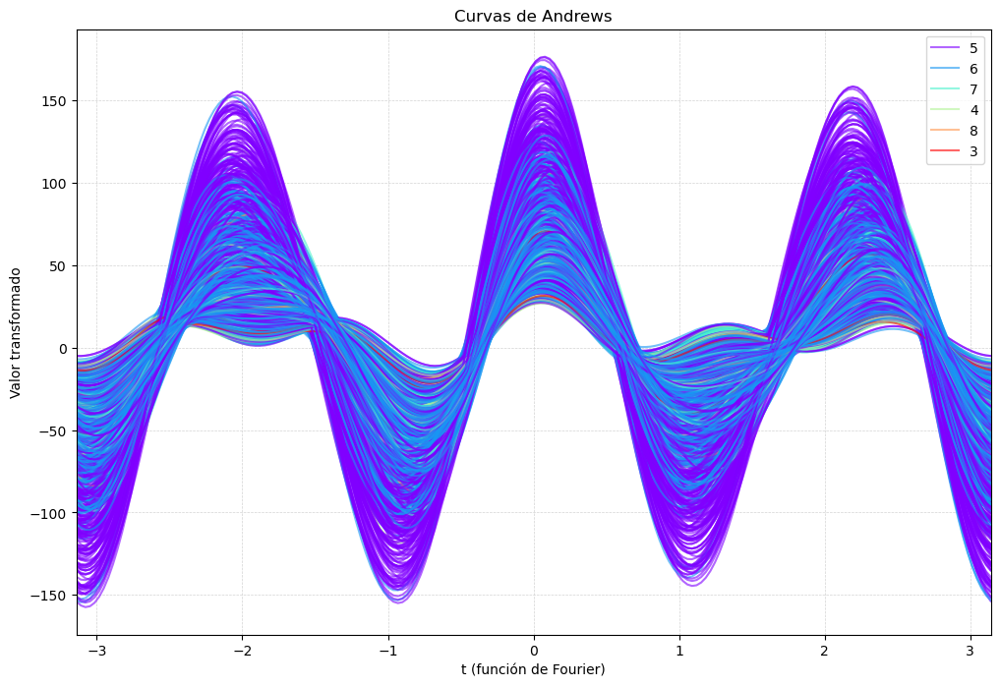

In [16]:
analisis_red_2.andrews_curve_class()

Se hizo la prueba KS para verificar que la distribución de los datos no cambió.

In [17]:
a = analisis_red_2.get_num()
ks_cols(df_red_final,df_red,a)

,col,ks,p
0,fixed_acidity,0.014909,0.993776
1,volatile_acidity,0.006020,1.000000
2,citric_acid,0.012568,0.999518
3,residual_sugar,0.015730,0.988287
4,chlorides,0.016094,0.984979
5,free_sulfur_dioxide,0.013317,0.998730
6,total_sulfur_dioxide,0.023461,0.771678
7,density,0.015962,0.986248
8,pH,0.016320,0.982628
9,sulphates,0.020005,0.905346


In [18]:
analisis_red_2.corr_matrix()

Hay un poco de correlación entre pH y fixed_acidity, y entre density y fixed_acidity. Sin embargo, se consideró que se podían dejar

In [19]:
df_final = analisis_red_2.get_df().copy()
df_final

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


### Modelo vino tinto

In [20]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1519 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed_acidity         1519 non-null   float64
 1   volatile_acidity      1519 non-null   float64
 2   citric_acid           1519 non-null   float64
 3   residual_sugar        1519 non-null   float64
 4   chlorides             1519 non-null   float64
 5   free_sulfur_dioxide   1519 non-null   float64
 6   total_sulfur_dioxide  1519 non-null   float64
 7   density               1519 non-null   float64
 8   pH                    1519 non-null   float64
 9   sulphates             1519 non-null   float64
 10  alcohol               1519 non-null   float64
 11  quality               1519 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 154.3 KB


In [21]:
y = df_final["quality"].map(lambda x: 1 if x >= 6 else 0)
X = df_final.copy().drop(columns = ["quality"])
var_num = analisis_red_2.get_num()
# Sobrescribes la variable con un nuevo array que excluye "quality"
var_num = var_num[var_num != "quality"]
#Particion
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1998)

In [22]:
#Escalamiento
scaler = MinMaxScaler()

#Ajustamos solo con train
scaler.fit(X_train[var_num])

#Transformar train y test
X_train[var_num] = scaler.fit_transform(X_train[var_num])
X_test[var_num] = scaler.transform(X_test[var_num])

#### XGBoost

In [23]:
#Espacio de búsqueda
param_dist = {
    "n_estimators": np.arange(200, 1500, 100),
    "learning_rate": np.linspace(0.01, 0.3, 20),
    "max_depth": np.arange(2, 12),
    "subsample": np.linspace(0.5, 1.0, 10),
    "colsample_bytree": np.linspace(0.5, 1.0, 10),
    "gamma": np.linspace(0, 5, 20),
    "reg_alpha": np.logspace(-5, 1, 20),
    "reg_lambda": np.logspace(-5, 2, 20)
}
#Búsqueda aleatoria
xgb = XGBClassifier(
    objective="binary:logistic",
    tree_method="hist",
    random_state=1998
)

In [24]:
random_search = RandomizedSearchCV(
    estimator=xgb,
    param_distributions=param_dist,
    n_iter=30,
    cv=5,
    scoring="roc_auc",
    verbose=1,
    random_state=1998,
    n_jobs=-1
    )

In [25]:
random_search.fit(X_train, y_train)

Fitting 5 folds for each of 30 candidates, totalling 150 fits


RandomizedSearchCV(cv=5,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, device=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           feature_weights=None, gamma=None,
                                           grow_policy=None,
                                           importance_type=None,
                                           interaction_constrain...
       2.97635144e-04, 6.95192796e-04, 1.62377674e-03, 3.79269019e-03,
       8.85866790e-03, 2.06913808e-02, 4.83293024e-02, 1.12883789e-01,
       2.63665090e-01, 6.15848211e-01, 1.43844989e+00, 3.35981829e+00,
       7.84759970e+00, 1.83298071e+01, 4.28133240e+01, 1.00000000e+02]),
                                        'subsample': array([0.5       , 0.55555556, 0.61111111, 0.66666667, 0.72222222,
       0.77777778, 0.83333333, 0.88888889, 0.94444444, 1.        ])},
                   random_state=1999, scoring='roc_auc', verbose=1)

In [26]:
best_model_XGB = random_search.best_estimator_
best_params_XGB = random_search.best_params_
best_model_XGB

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=np.float64(0.8888888888888888), device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, feature_weights=None,
              gamma=np.float64(0.0), grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=np.float64(0.01),
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=np.int64(9), max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=np.int64(1000), n_jobs=None,
              num_parallel_tree=None, ...)

In [27]:
cv_scores = cross_val_score(best_model_XGB, X_train, y_train, cv=5, scoring="accuracy")
print("\n=== Cross Validation ===")
print(f"Media: {cv_scores.mean():.4f}")
print(f"Mediana: {np.median(cv_scores):.4f}")
print(f"Desviación estándar: {cv_scores.std():.4f}")


=== Cross Validation ===
Media: 0.7959
Mediana: 0.7925
Desviación estándar: 0.0251



=== Resultados en Train (umbral = 0.5) ===
Accuracy:      1.0000
Sensibilidad:  1.0000
Especificidad: 1.0000
AUC:           1.0000

--- Calibración Youden J ---
Umbral óptimo:          0.7664
Sensibilidad óptima:    1.0000
Especificidad óptima:   1.0000

=== Resultados en Train (umbral óptimo) ===
Accuracy:      1.0000
Sensibilidad:  1.0000
Especificidad: 1.0000


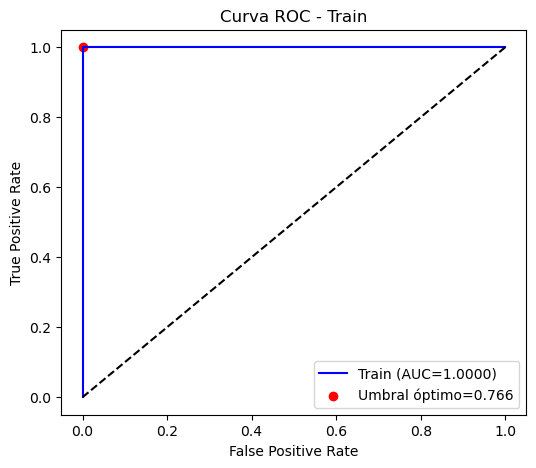


=== Resultados en Test (umbral = 0.5) ===
Accuracy:      0.8048
Sensibilidad:  0.8347
Especificidad: 0.7710
AUC:           0.8707

--- Calibración Youden J ---
Umbral óptimo:          0.5578
Sensibilidad óptima:    0.8264
Especificidad óptima:   0.7850

=== Resultados en Test (umbral óptimo) ===
Accuracy:      0.8070
Sensibilidad:  0.8264
Especificidad: 0.7850


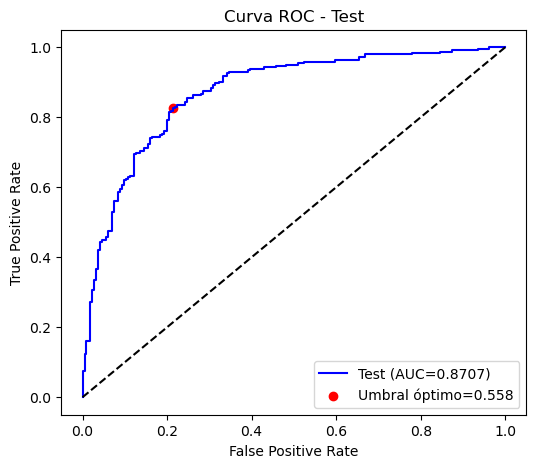

In [28]:
#Evaluación del rendimiento
evaluate_model(best_model_XGB, X_train, y_train, "Train")
evaluate_model(best_model_XGB, X_test, y_test, "Test")

#### Random Forest

In [29]:
param_dist_rf = {
    "n_estimators": np.arange(200, 1500, 100),
    "max_depth": np.arange(5, 35, 5),
    "max_features": ['sqrt', 'log2', None],
    "min_samples_split": [2, 5, 10, 15],
    "min_samples_leaf": [1, 2, 4, 8],
    "bootstrap": [True, False],
    "criterion": ["gini", "entropy"]
}

rf = RandomForestClassifier(random_state=1998)

In [30]:
random_search_rf = RandomizedSearchCV(
    estimator=rf,
    param_distributions=param_dist_rf,
    n_iter=30,           # Mantenemos las mismas iteraciones
    cv=5,                # Mismos folds
    scoring="roc_auc",   # Misma métrica
    verbose=1,
    random_state=1998,
    n_jobs=-1
)

In [31]:
random_search_rf.fit(X_train, y_train)

Fitting 5 folds for each of 30 candidates, totalling 150 fits


RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(random_state=1999),
                   n_iter=30, n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'criterion': ['gini', 'entropy'],
                                        'max_depth': array([ 5, 10, 15, 20, 25, 30]),
                                        'max_features': ['sqrt', 'log2', None],
                                        'min_samples_leaf': [1, 2, 4, 8],
                                        'min_samples_split': [2, 5, 10, 15],
                                        'n_estimators': array([ 200,  300,  400,  500,  600,  700,  800,  900, 1000, 1100, 1200,
       1300, 1400])},
                   random_state=1999, scoring='roc_auc', verbose=1)

In [32]:
best_model = random_search_rf.best_estimator_
best_params = random_search_rf.best_params_
best_model

RandomForestClassifier(criterion='entropy', max_depth=np.int64(25),
                       max_features=None, n_estimators=np.int64(600),
                       random_state=1999)

In [33]:
cv_scores = cross_val_score(best_model, X_train, y_train, cv=5, scoring="accuracy")
print("\n=== Cross Validation ===")
print(f"Media: {cv_scores.mean():.4f}")
print(f"Mediana: {np.median(cv_scores):.4f}")
print(f"Desviación estándar: {cv_scores.std():.4f}")


=== Cross Validation ===
Media: 0.7855
Mediana: 0.8019
Desviación estándar: 0.0335



=== Resultados en Train (umbral = 0.5) ===
Accuracy:      1.0000
Sensibilidad:  1.0000
Especificidad: 1.0000
AUC:           1.0000

--- Calibración Youden J ---
Umbral óptimo:          0.6150
Sensibilidad óptima:    1.0000
Especificidad óptima:   1.0000

=== Resultados en Train (umbral óptimo) ===
Accuracy:      1.0000
Sensibilidad:  1.0000
Especificidad: 1.0000


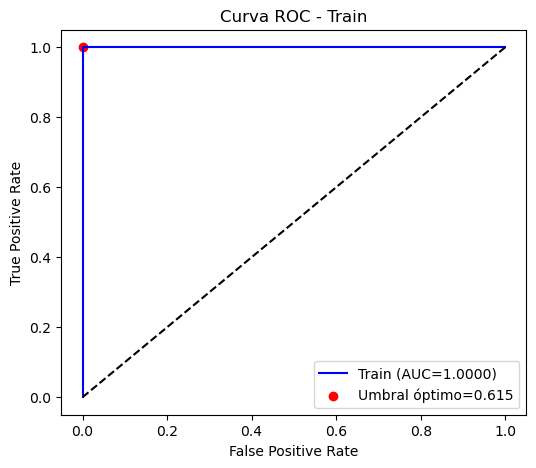


=== Resultados en Test (umbral = 0.5) ===
Accuracy:      0.8070
Sensibilidad:  0.8223
Especificidad: 0.7897
AUC:           0.8743

--- Calibración Youden J ---
Umbral óptimo:          0.4167
Sensibilidad óptima:    0.8926
Especificidad óptima:   0.7290

=== Resultados en Test (umbral óptimo) ===
Accuracy:      0.8158
Sensibilidad:  0.8926
Especificidad: 0.7290


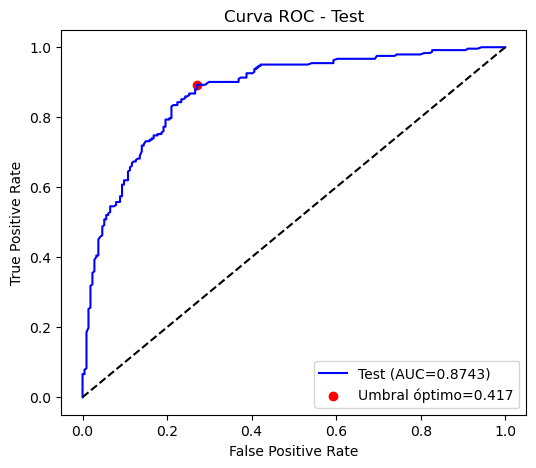

In [34]:
#Evaluación del rendimiento
evaluate_model(best_model, X_train, y_train, "Train")
evaluate_model(best_model, X_test, y_test, "Test")

#### LightGBM

In [35]:
param_dist_lgbm = {
    "n_estimators": np.arange(200, 1500, 100),
    "learning_rate": np.linspace(0.01, 0.3, 20),
    "num_leaves": np.arange(20, 150, 10),
    "max_depth": [-1, 5, 10, 15, 20],
    "min_child_samples": np.arange(10, 100, 10),
    "subsample": np.linspace(0.5, 1.0, 10),
    "colsample_bytree": np.linspace(0.5, 1.0, 10),
    "reg_alpha": np.logspace(-5, 1, 20),
    "reg_lambda": np.logspace(-5, 2, 20),
    "subsample_freq": [1, 5, 10]
}

lgbm = LGBMClassifier(
    objective="multiclass",
    num_class=6,
    metric="multi_logloss",
    random_state=1998,
    verbose=-1
)

In [36]:
random_search_lgbm = RandomizedSearchCV(
    estimator=lgbm,
    param_distributions=param_dist_lgbm,
    n_iter=30,
    cv=5,
    scoring="roc_auc",
    verbose=1,
    random_state=1998,
    n_jobs=-1
)

In [37]:
random_search_lgbm.fit(X_train, y_train)

ValueError: high is out of bounds for int32

In [38]:
best_model = random_search_lgbm.best_estimator_
best_params = random_search_lgbm.best_params_
best_model

AttributeError: 'RandomizedSearchCV' object has no attribute 'best_estimator_'

In [39]:
cv_scores = cross_val_score(best_model, X_train, y_train, cv=5, scoring="accuracy")
print("\n=== Cross Validation ===")
print(f"Media: {cv_scores.mean():.4f}")
print(f"Mediana: {np.median(cv_scores):.4f}")
print(f"Desviación estándar: {cv_scores.std():.4f}")


=== Cross Validation ===
Media: 0.7855
Mediana: 0.8019
Desviación estándar: 0.0335


In [40]:
#Evaluación del rendimiento
evaluate_model(random_search_lgbm, X_train, y_train, "Train")
evaluate_model(random_search_lgbm, X_test, y_test, "Test")

NotFittedError: This RandomizedSearchCV instance is not fitted yet. Call 'fit' with appropriate arguments before using this estimator.

#### Evaluacion de los modelos
Random Forest es el mejor modelo por tres razones clave:

1.  Mayor Poder Predictivo (AUC 0.90): Supera claramente a XGBoost y LightGBM (ambos en ~0.87), indicando que es el más robusto para distinguir entre clases.
2.  Mejor Generalización: Obtiene la Accuracy más alta (82.46%) en el conjunto de prueba tras ajustar el umbral.
3.  Equilibrio Sólido: A diferencia de XGBoost, que sacrifica especificidad, Random Forest mantiene un balance simétrico y fiable entre detectar positivos (83%) y negativos (81%).

#### Se importa modelo Random Forest en joblib

In [ ]:
import joblib

# Modelo en formato joblib
joblib.dump(best_model, "modelo_rf.joblib")

In [ ]:
# Carga del modelo
rf_model = joblib.load("modelo_rf.joblib")

## Vino Blanco

In [8]:
df_white = df[df["type"] == "white"].copy()

# Resetea el índice y elimina el índice antiguo
df_white = df_white.reset_index(drop=True)

In [9]:
#Vista rápida
skim(df_white)

╭──────────────────────────────────────────────── skimpy summary ─────────────────────────────────────────────────╮
│          Data Summary                Data Types                                                                 │
│ ┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓ ┏━━━━━━━━━━━━━┳━━━━━━━┓                                                          │
│ ┃ Dataframe         ┃ Values ┃ ┃ Column Type ┃ Count ┃                                                          │
│ ┡━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩ ┡━━━━━━━━━━━━━╇━━━━━━━┩                                                          │
│ │ Number of rows    │ 4898   │ │ float64     │ 11    │                                                          │
│ │ Number of columns │ 13     │ │ int64       │ 1     │                                                          │
│ └───────────────────┴────────┘ │ string      │ 1     │                                                          │
│                                └─────────────┴───────┘                                                          │
│                                                     number                                                      │
│ ┏━━━━━━━━━━━━━━━━━━━━━━┳━━━━┳━━━━━━┳━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━━┓  │
│ ┃ column               ┃ NA ┃ NA % ┃ mean    ┃ sd       ┃ p0     ┃ p25    ┃ p50    ┃ p75    ┃ p100  ┃ hist   ┃  │
│ ┡━━━━━━━━━━━━━━━━━━━━━━╇━━━━╇━━━━━━╇━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━━┩  │
│ │ fixed_acidity        │  0 │    0 │   6.855 │   0.8439 │    3.8 │    6.3 │    6.8 │    7.3 │  14.2 │   ▇▃   │  │
│ │ volatile_acidity     │  0 │    0 │  0.2782 │   0.1008 │   0.08 │   0.21 │   0.26 │   0.32 │   1.1 │  ▆▇▁   │  │
│ │ citric_acid          │  0 │    0 │  0.3342 │    0.121 │      0 │   0.27 │   0.32 │   0.39 │  1.66 │  ▃▇▁   │  │
│ │ residual_sugar       │  0 │    0 │   6.391 │    5.072 │    0.6 │    1.7 │    5.2 │    9.9 │  65.8 │   ▇▂   │  │
│ │ chlorides            │  0 │    0 │ 0.04577 │  0.02185 │  0.009 │  0.036 │  0.043 │   0.05 │ 0.346 │   ▇    │  │
│ │ free_sulfur_dioxide  │  0 │    0 │   35.31 │    17.01 │      2 │     23 │     34 │     46 │   289 │   ▇▂   │  │
│ │ total_sulfur_dioxide │  0 │    0 │   138.4 │     42.5 │      9 │    108 │    134 │    167 │   440 │  ▁▇▅   │  │
│ │ density              │  0 │    0 │   0.994 │ 0.002991 │ 0.9871 │ 0.9917 │ 0.9937 │ 0.9961 │ 1.039 │   ▇▃   │  │
│ │ pH                   │  0 │    0 │   3.188 │    0.151 │   2.72 │   3.09 │   3.18 │   3.28 │  3.82 │  ▃▇▃▁  │  │
│ │ sulphates            │  0 │    0 │  0.4898 │   0.1141 │   0.22 │   0.41 │   0.47 │   0.55 │  1.08 │  ▂▇▅▁  │  │
│ │ alcohol              │  0 │    0 │   10.51 │    1.231 │      8 │    9.5 │   10.4 │   11.4 │  14.2 │ ▃▇▆▅▃  │  │
│ │ quality              │  0 │    0 │   5.878 │   0.8856 │      3 │      5 │      6 │      6 │     9 │  ▁▅▇▃▁ │  │
│ └──────────────────────┴────┴──────┴─────────┴──────────┴────────┴────────┴────────┴────────┴───────┴────────┘  │
│                                                     string                                                      │
│ ┏━━━━━━━━━┳━━━━━┳━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━┳━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━┓  │
│ ┃ column  ┃ NA  ┃ NA %  ┃ shortest  ┃ longest  ┃ min   ┃ max   ┃ chars per row ┃ words per row ┃ total words ┃  │
│ ┡━━━━━━━━━╇━━━━━╇━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━╇━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━┩  │
│ │ type    │   0 │     0 │ white     │ white    │ white │ white │             5 │             1 │        4898 │  │
│ └─────────┴─────┴───────┴───────────┴──────────┴───────┴───────┴───────────────┴───────────────┴─────────────┘  │
╰────────────────────────────────────────────────────── End ──────────────────────────────────────────────────────╯

In [10]:
analisis_white = analyze(df_white, 'quality')

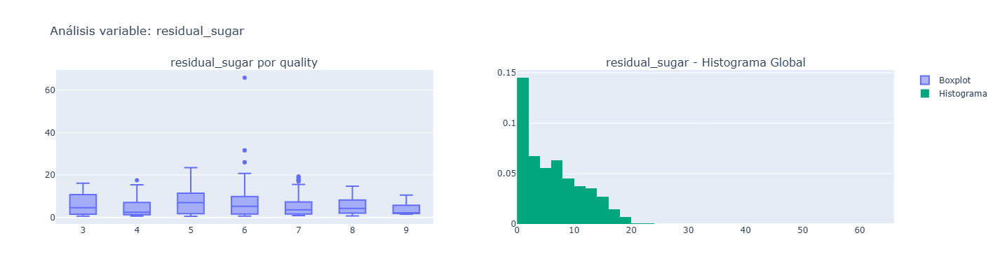

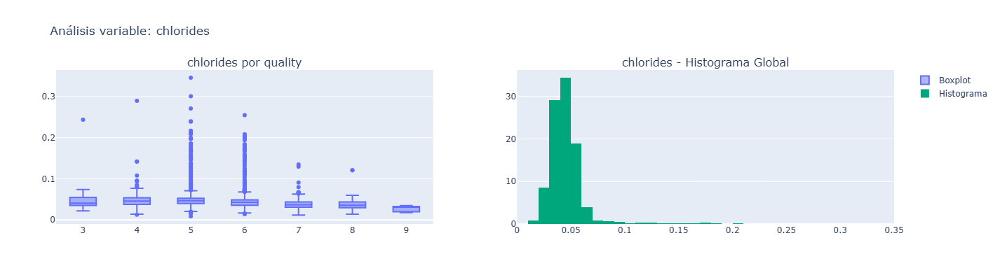

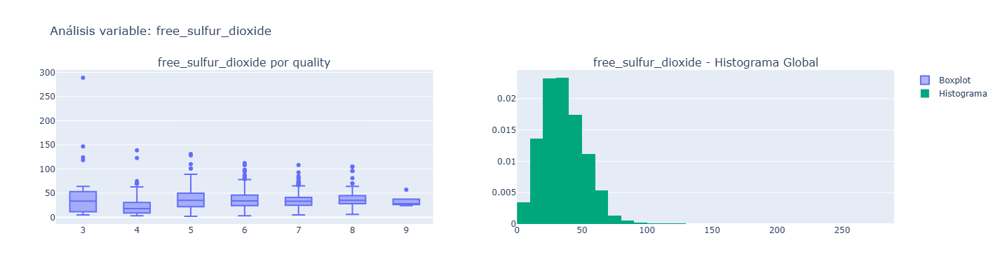

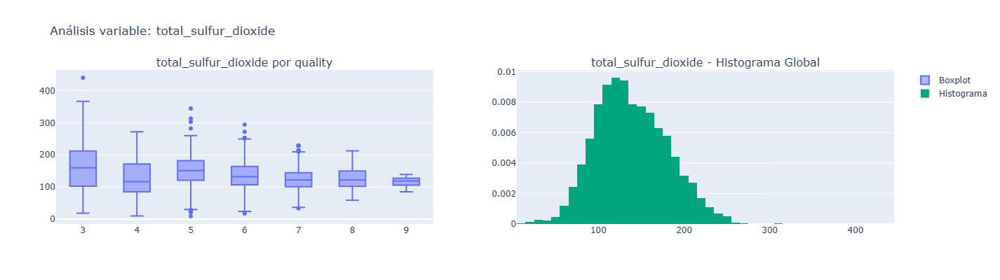

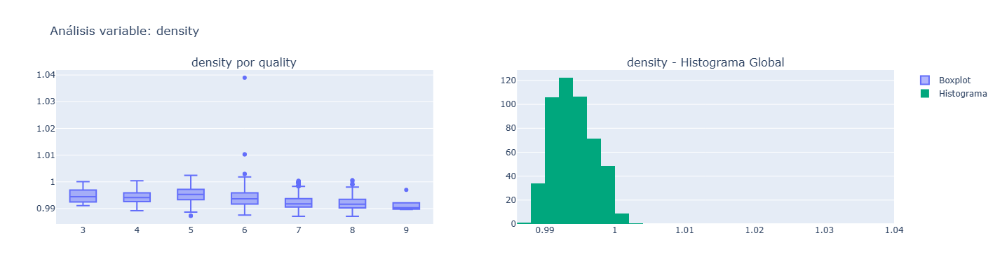

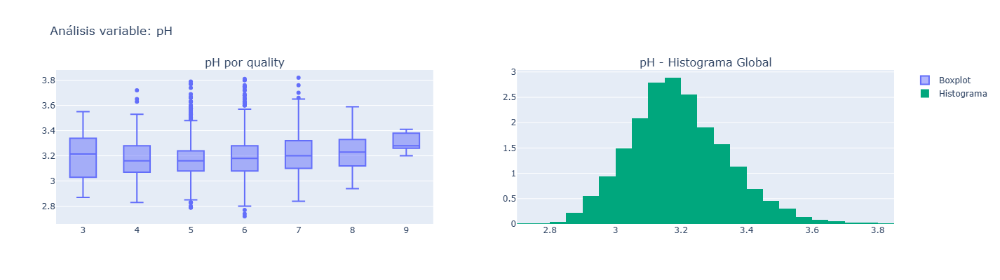

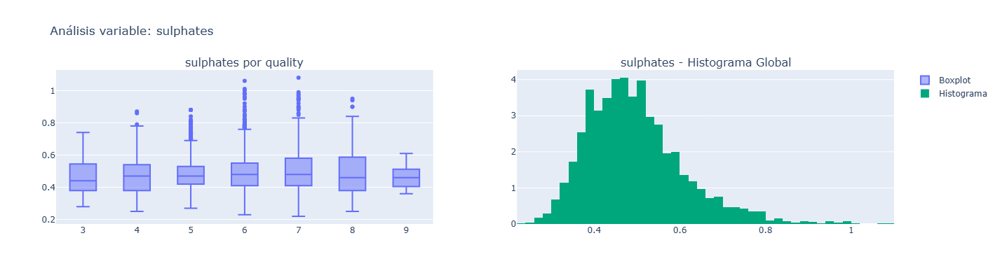

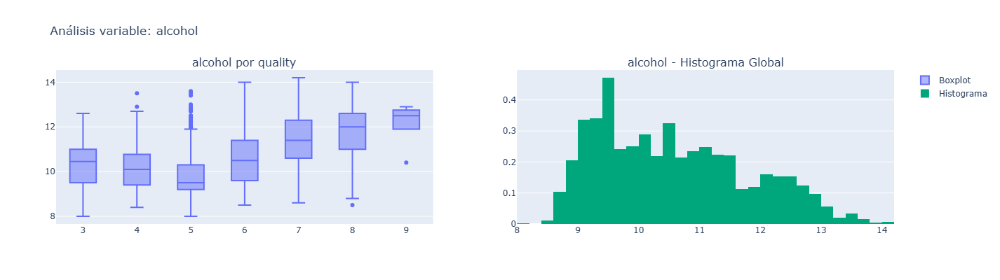

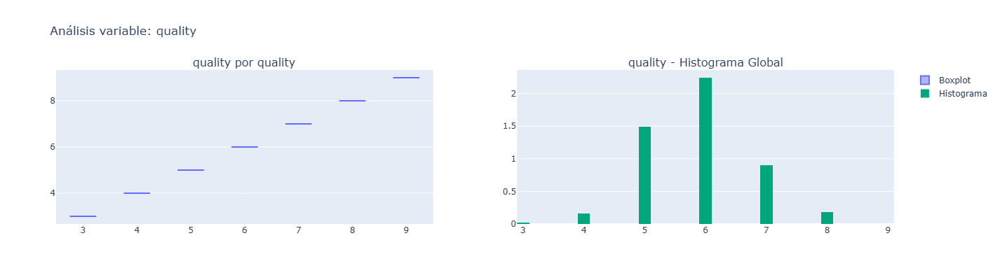

In [11]:
analisis_white.plot_num_class()

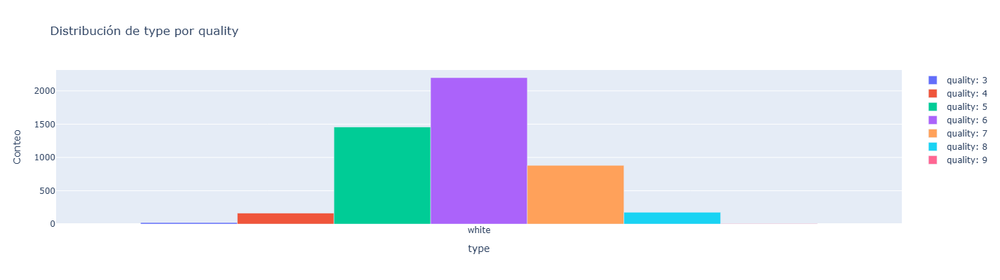

In [12]:
analisis_white.plot_cat_class()

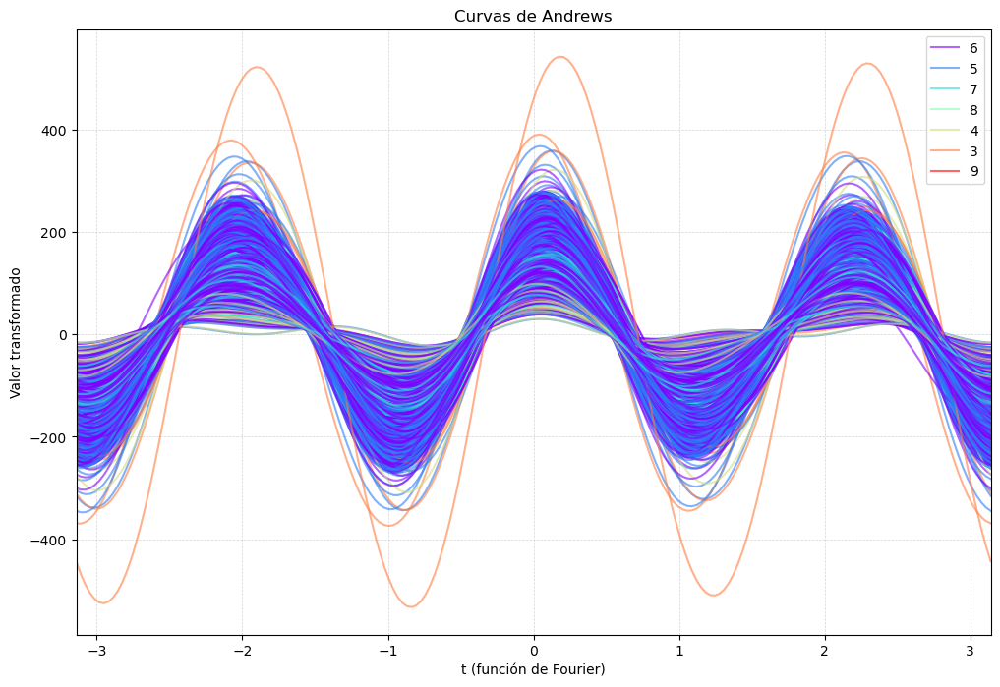

In [13]:
analisis_white.andrews_curve_class()

C:\Users\erika\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2732: UserWarning:

X has feature names, but IsolationForest was fitted without feature names



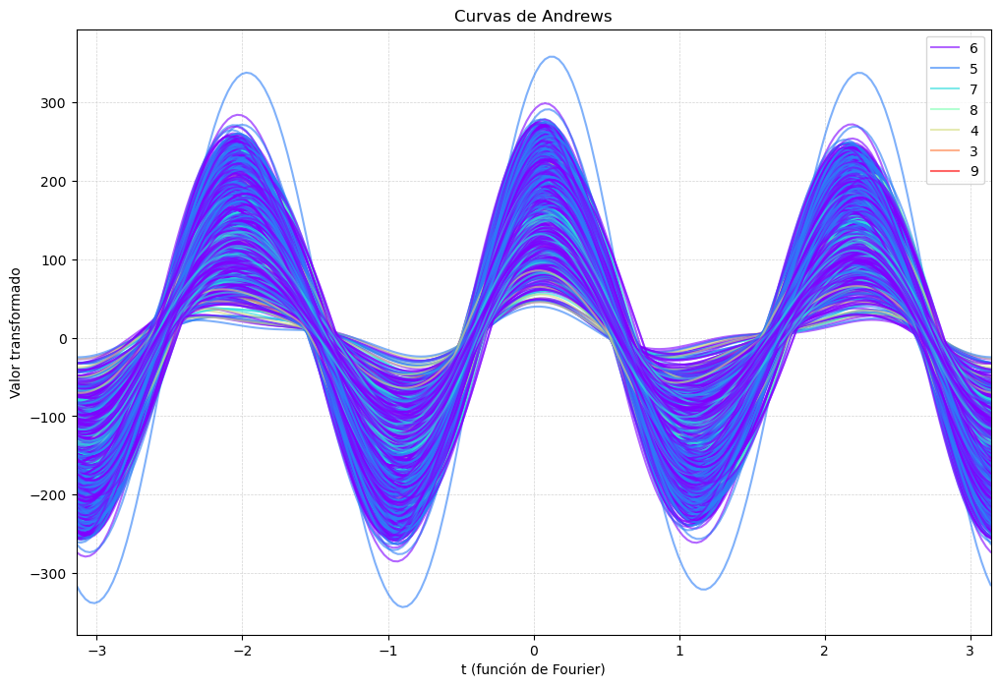

In [14]:
df_white_final = remove_outliers_iforest(df_white.drop(columns=['type']))
analisis_white_2 = analyze(df_white_final, 'quality')
analisis_white_2.andrews_curve_class()

Se hizo la prueba KS para verificar que la distribución de los datos no cambió.

In [15]:
a = analisis_white_2.get_num()
ks_cols(df_white_final,df_white,a)

,col,ks,p
0,fixed_acidity,0.009121,0.987345
1,volatile_acidity,0.018705,0.367809
2,citric_acid,0.010334,0.957579
3,residual_sugar,0.007133,0.999642
4,chlorides,0.008335,0.995788
5,free_sulfur_dioxide,0.009108,0.987543
6,total_sulfur_dioxide,0.011396,0.910993
7,density,0.011140,0.923969
8,pH,0.008193,0.996666
9,sulphates,0.009733,0.975256


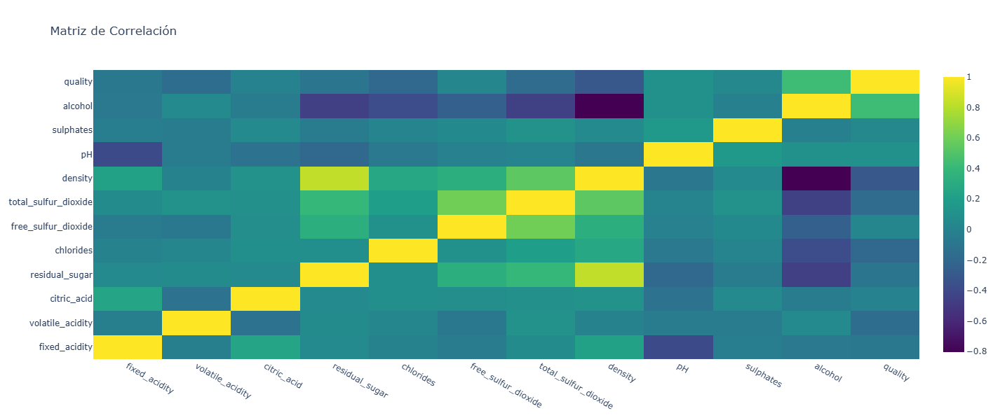

In [16]:
analisis_white_2.corr_matrix()

Se encontro una correlación alta entre density y residual_sugar, y density y alcohol

### Modelo vino blanco

In [17]:
y = df_white_final["quality"].map(lambda x: 1 if x >= 6 else 0)
X = df_white_final.copy().drop(columns = ["quality"])

var_num = analisis_white_2.get_num()

# Sobrescribes la variable con un nuevo array que excluye "quality"
var_num = var_num[var_num != "quality"]

In [18]:
X.head()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9


In [19]:
df_y = pd.DataFrame(y)

In [20]:
df_y.head()

,quality
0,1
1,1
2,1
3,1
4,1


In [21]:
df_y['quality'].value_counts()

quality
1    3142
0    1511
Name: count, dtype: int64

In [22]:
#Particion
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1998)

In [23]:
# Escala solo con datos de entrenamiento
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)

In [24]:
# Ajusta un PCA temporal para calcular varianza explicada
#pca_temp = PCA().fit(X_train_scaled)

In [25]:
# Calcular la varianza explicada acumulada
#cumulative_variance = np.cumsum(pca_temp.explained_variance_ratio_)

In [26]:
# Calcular la varianza explicada acumulada
plt.figure(figsize=(10, 7))
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance,
         marker='o', linestyle='--')
plt.title('Varianza Explicada Acumulada por Componentes Principales')
plt.xlabel('Número de Componentes')
plt.ylabel('Varianza Explicada Acumulada')
plt.grid(True)
plt.axhline(y=0.95, color='r', linestyle='-', label='95% Varianza Explicada')
plt.legend(loc='best')
plt.show()

# Determinar el número de componentes para explicar el 95% de la varianza
n_components_95 = np.where(cumulative_variance >= 0.95)[0][0] + 1
print(f"Número de componentes necesarios para explicar el 95% de la varianza: {n_components_95}")

NameError: name 'cumulative_variance' is not defined

<Figure size 1000x700 with 0 Axes>

#### XGBoost

In [27]:
# Pipeline XGBoost
pipeline = Pipeline([
    ("scaler", StandardScaler()),
    ("xgb", XGBClassifier(
        objective="binary:logistic",
        tree_method="hist",
        random_state=1989
    ))
])

In [28]:
random_search = RandomizedSearchCV(
    estimator=pipeline,
    param_distributions = {
        "xgb__n_estimators": np.arange(200, 1500, 100),
        "xgb__learning_rate": np.linspace(0.01, 0.3, 20),
        "xgb__max_depth": np.arange(2, 8),
        "xgb__subsample": np.linspace(0.5, 1.0, 10),
        "xgb__colsample_bytree": np.linspace(0.5, 1.0, 10),
        "xgb__gamma": np.linspace(0, 5, 20),
        "xgb__reg_alpha": np.logspace(-5, 1, 20),
        "xgb__reg_lambda": np.logspace(-5, 2, 20)
    },
    n_iter=30,
    cv=5,
    scoring="roc_auc",
    verbose=1,
    random_state=1989,
    n_jobs=-1
)

In [29]:
random_search.fit(X_train, y_train)

Fitting 5 folds for each of 30 candidates, totalling 150 fits


RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                             ('xgb',
                                              XGBClassifier(base_score=None,
                                                            booster=None,
                                                            callbacks=None,
                                                            colsample_bylevel=None,
                                                            colsample_bynode=None,
                                                            colsample_bytree=None,
                                                            device=None,
                                                            early_stopping_rounds=None,
                                                            enable_categorical=False,
                                                            eval_metric=None,
                                                            feature_types=None,
                                                            feature_weights=None,
                                                            gamma=None,
                                                            grow_pol...
       8.85866790e-03, 2.06913808e-02, 4.83293024e-02, 1.12883789e-01,
       2.63665090e-01, 6.15848211e-01, 1.43844989e+00, 3.35981829e+00,
       7.84759970e+00, 1.83298071e+01, 4.28133240e+01, 1.00000000e+02]),
                                        'xgb__subsample': array([0.5       , 0.55555556, 0.61111111, 0.66666667, 0.72222222,
       0.77777778, 0.83333333, 0.88888889, 0.94444444, 1.        ])},
                   random_state=1989, scoring='roc_auc', verbose=1)

In [30]:
best_model_XGB = random_search.best_estimator_
best_params_XGB = random_search.best_params_
best_model_XGB

Pipeline(steps=[('scaler', StandardScaler()),
                ('xgb',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=np.float64(0.7777777777777778),
                               device=None, early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, feature_weights=None,
                               gamma=np.float64(0.52631578...
                               grow_policy=None, importance_type=None,
                               interaction_constraints=None,
                               learning_rate=np.float64(0.05578947368421053),
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=np.int64(5), max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, multi_strategy=None,
                               n_estimators=np.int64(800), n_jobs=None,
                               num_parallel_tree=None, ...))])

In [31]:
best_params_XGB

{'xgb__subsample': np.float64(0.7777777777777778),
 'xgb__reg_lambda': np.float64(0.04832930238571752),
 'xgb__reg_alpha': np.float64(0.01438449888287663),
 'xgb__n_estimators': np.int64(800),
 'xgb__max_depth': np.int64(5),
 'xgb__learning_rate': np.float64(0.05578947368421053),
 'xgb__gamma': np.float64(0.5263157894736842),
 'xgb__colsample_bytree': np.float64(0.7777777777777778)}


=== Resultados en Train (umbral = 0.5) ===
Accuracy:      0.9957
Sensibilidad:  1.0000
Especificidad: 0.9869
AUC:           0.9999

--- Calibración Youden J ---
Umbral óptimo:          0.5584
Sensibilidad óptima:    0.9977
Especificidad óptima:   0.9944

=== Resultados en Train (umbral óptimo) ===
Accuracy:      0.9966
Sensibilidad:  0.9977
Especificidad: 0.9944


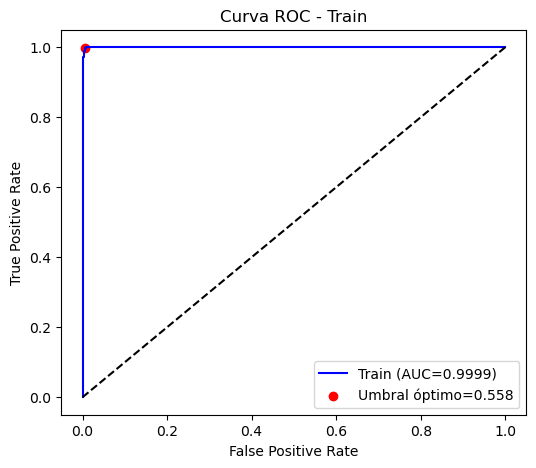


=== Resultados en Test (umbral = 0.5) ===
Accuracy:      0.8123
Sensibilidad:  0.8742
Especificidad: 0.6787
AUC:           0.8690

--- Calibración Youden J ---
Umbral óptimo:          0.6739
Sensibilidad óptima:    0.8208
Especificidad óptima:   0.7805

=== Resultados en Test (umbral óptimo) ===
Accuracy:      0.8080
Sensibilidad:  0.8208
Especificidad: 0.7805


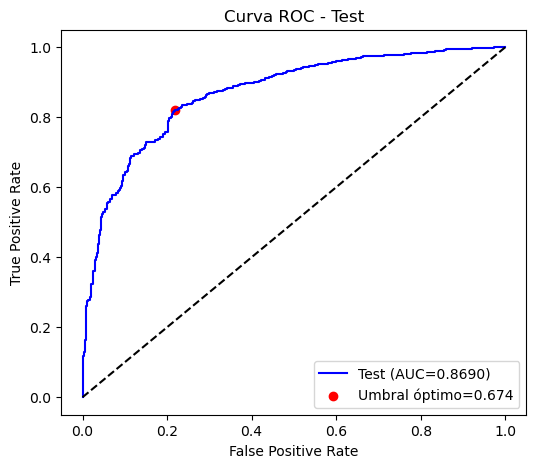

In [32]:
#Evaluación del rendimiento
evaluate_model(best_model_XGB, X_train, y_train, "Train")
evaluate_model(best_model_XGB, X_test, y_test, "Test")

#### Random Forest

In [34]:
# Pipeline Rnadom Forest
pipeline = Pipeline([
    ("scaler", StandardScaler()),
    #("pca", PCA(n_components=n_components_95)),
    ("rf", RandomForestClassifier(
        random_state=1998
    ))
])

In [35]:
param_dist_rf = {
    "n_estimators": np.arange(200, 1500, 100),
    "max_depth": np.arange(5, 10, 15),
    "max_features": ['sqrt', 'log2', None],
    "min_samples_split": [2, 5, 10, 15],
    "min_samples_leaf": [1, 2, 4, 8],
    "bootstrap": [True, False],
    "criterion": ["gini", "entropy"]
}

rf = RandomForestClassifier(random_state=1998)

In [36]:
random_search_rf = RandomizedSearchCV(
    estimator=rf,
    param_distributions=param_dist_rf,
    n_iter=30,           # Mantenemos las mismas iteraciones
    cv=5,                # Mismos folds
    scoring="roc_auc",   # Misma métrica
    verbose=1,
    random_state=1998,
    n_jobs=-1
)

In [37]:
random_search_rf.fit(X_train, y_train)

Fitting 5 folds for each of 30 candidates, totalling 150 fits


RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(random_state=1998),
                   n_iter=30, n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'criterion': ['gini', 'entropy'],
                                        'max_depth': array([5]),
                                        'max_features': ['sqrt', 'log2', None],
                                        'min_samples_leaf': [1, 2, 4, 8],
                                        'min_samples_split': [2, 5, 10, 15],
                                        'n_estimators': array([ 200,  300,  400,  500,  600,  700,  800,  900, 1000, 1100, 1200,
       1300, 1400])},
                   random_state=1998, scoring='roc_auc', verbose=1)

In [38]:
best_model_rf = random_search_rf.best_estimator_
best_params_rf = random_search_rf.best_params_
best_model_rf

RandomForestClassifier(criterion='entropy', max_depth=np.int64(5),
                       max_features=None, min_samples_leaf=2,
                       n_estimators=np.int64(800), random_state=1998)

In [39]:
cv_scores = cross_val_score(best_model_rf, X_train, y_train, cv=5, scoring="accuracy")
print("\n=== Cross Validation ===")
print(f"Media: {cv_scores.mean():.4f}")
print(f"Mediana: {np.median(cv_scores):.4f}")
print(f"Desviación estándar: {cv_scores.std():.4f}")


=== Cross Validation ===
Media: 0.7660
Mediana: 0.7730
Desviación estándar: 0.0203


In [40]:
best_params_rf

{'n_estimators': np.int64(800),
 'min_samples_split': 2,
 'min_samples_leaf': 2,
 'max_features': None,
 'max_depth': np.int64(5),
 'criterion': 'entropy',
 'bootstrap': True}


=== Resultados en Train (umbral = 0.5) ===
Accuracy:      0.7903
Sensibilidad:  0.8665
Especificidad: 0.6342
AUC:           0.8722

--- Calibración Youden J ---
Umbral óptimo:          0.7107
Sensibilidad óptima:    0.7395
Especificidad óptima:   0.8428

=== Resultados en Train (umbral óptimo) ===
Accuracy:      0.7734
Sensibilidad:  0.7395
Especificidad: 0.8428


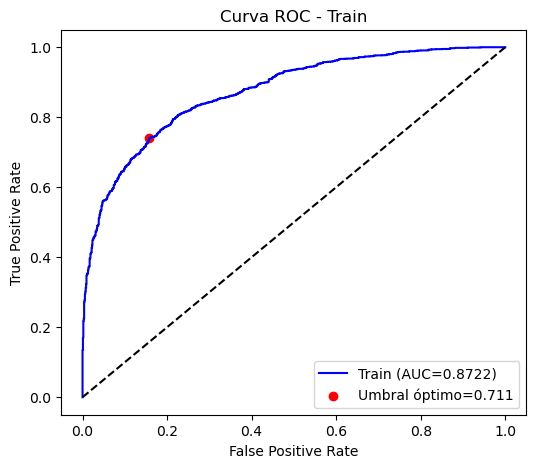


=== Resultados en Test (umbral = 0.5) ===
Accuracy:      0.7471
Sensibilidad:  0.8333
Especificidad: 0.5611
AUC:           0.8112

--- Calibración Youden J ---
Umbral óptimo:          0.6323
Sensibilidad óptima:    0.7715
Especificidad óptima:   0.7240

=== Resultados en Test (umbral óptimo) ===
Accuracy:      0.7564
Sensibilidad:  0.7715
Especificidad: 0.7240


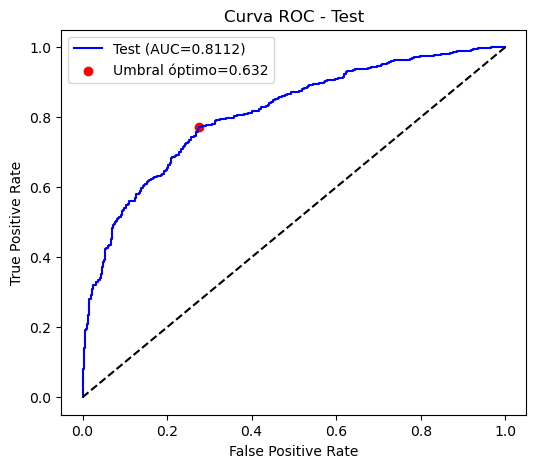

In [41]:
#Evaluación del rendimiento
evaluate_model(best_model_rf, X_train, y_train, "Train")
evaluate_model(best_model_rf, X_test, y_test, "Test")

#### LightGBM

In [42]:
# Pipeline Rnadom Forest
pipeline = Pipeline([
    ("scaler", StandardScaler()),
    #("pca", PCA(n_components=n_components_95)),
    ("lgbm", LGBMClassifier(
        objective="multiclass",
        num_class=6,
        metric="multi_logloss",
        random_state=1998,
        verbose=-1
    ))
])

In [43]:
param_dist_lgbm = {
    "lgbm__n_estimators": np.arange(200, 1500, 200),
    "lgbm__learning_rate": np.linspace(0.01, 0.3, 10),
    "lgbm__num_leaves": np.arange(20, 150, 20),
    "lgbm__max_depth": [3, 5, 7, 9],
    "lgbm__min_child_samples": np.arange(10, 100, 10),
    "lgbm__bagging_fraction": np.linspace(0.6, 1.0, 5),   # en lugar de subsample
    "lgbm__bagging_freq": [1, 5, 10],                     # en lugar de subsample_freq
    "lgbm__colsample_bytree": np.linspace(0.6, 1.0, 5),
    "lgbm__reg_alpha": np.logspace(-5, 1, 10),
    "lgbm__reg_lambda": np.logspace(-5, 2, 10)
}

In [44]:
random_search_lgbm = RandomizedSearchCV(
    estimator=pipeline,
    param_distributions=param_dist_lgbm,
    n_iter=30,
    cv=5,
    scoring="roc_auc_ovr",
    verbose=1,
    random_state=1998,
    n_jobs=-1
)

In [45]:
random_search_lgbm.fit(X_train, y_train)

Fitting 5 folds for each of 30 candidates, totalling 150 fits


RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                             ('lgbm',
                                              LGBMClassifier(metric='multi_logloss',
                                                             num_class=6,
                                                             objective='multiclass',
                                                             random_state=1998,
                                                             verbose=-1))]),
                   n_iter=30, n_jobs=-1,
                   param_distributions={'lgbm__bagging_fraction': array([0.6, 0.7, 0.8, 0.9, 1. ]),
                                        'lgbm__bagging_freq': [1, 5, 10],
                                        'lgbm__colsample_bytree': array([0....
                                        'lgbm__reg_alpha': array([1.00000000e-05, 4.64158883e-05, 2.15443469e-04, 1.00000000e-03,
       4.64158883e-03, 2.15443469e-02, 1.00000000e-01, 4.64158883e-01,
       2.15443469e+00, 1.00000000e+01]),
                                        'lgbm__reg_lambda': array([1.00000000e-05, 5.99484250e-05, 3.59381366e-04, 2.15443469e-03,
       1.29154967e-02, 7.74263683e-02, 4.64158883e-01, 2.78255940e+00,
       1.66810054e+01, 1.00000000e+02])},
                   random_state=1998, scoring='roc_auc_ovr', verbose=1)

In [46]:
best_model_lgbm = random_search_lgbm.best_estimator_
best_params_lgbm = random_search_lgbm.best_params_
best_model_lgbm

Pipeline(steps=[('scaler', StandardScaler()),
                ('lgbm',
                 LGBMClassifier(bagging_fraction=np.float64(0.9),
                                bagging_freq=10,
                                colsample_bytree=np.float64(0.9),
                                learning_rate=np.float64(0.20333333333333334),
                                max_depth=7, metric='multi_logloss',
                                min_child_samples=np.int64(10),
                                n_estimators=np.int64(800), num_class=6,
                                num_leaves=np.int64(60), objective='multiclass',
                                random_state=1998,
                                reg_alpha=np.float64(0.46415888336127725),
                                reg_lambda=np.float64(0.00035938136638046257),
                                verbose=-1))])

In [47]:
cv_scores = cross_val_score(best_model_lgbm, X_train, y_train, cv=5, scoring="accuracy")
print("\n=== Cross Validation ===")
print(f"Media: {cv_scores.mean():.4f}")
print(f"Mediana: {np.median(cv_scores):.4f}")
print(f"Desviación estándar: {cv_scores.std():.4f}")

C:\Users\erika\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning:

X does not have valid feature names, but LGBMClassifier was fitted with feature names

C:\Users\erika\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning:

X does not have valid feature names, but LGBMClassifier was fitted with feature names

C:\Users\erika\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning:

X does not have valid feature names, but LGBMClassifier was fitted with feature names

C:\Users\erika\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning:

X does not have valid feature names, but LGBMClassifier was fitted with feature names




=== Cross Validation ===
Media: 0.8115
Mediana: 0.8111
Desviación estándar: 0.0072


C:\Users\erika\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning:

X does not have valid feature names, but LGBMClassifier was fitted with feature names



C:\Users\erika\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning:

X does not have valid feature names, but LGBMClassifier was fitted with feature names

C:\Users\erika\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning:

X does not have valid feature names, but LGBMClassifier was fitted with feature names




=== Resultados en Train (umbral = 0.5) ===
Accuracy:      1.0000
Sensibilidad:  1.0000
Especificidad: 1.0000
AUC:           1.0000

--- Calibración Youden J ---
Umbral óptimo:          0.7872
Sensibilidad óptima:    1.0000
Especificidad óptima:   1.0000

=== Resultados en Train (umbral óptimo) ===
Accuracy:      1.0000
Sensibilidad:  1.0000
Especificidad: 1.0000


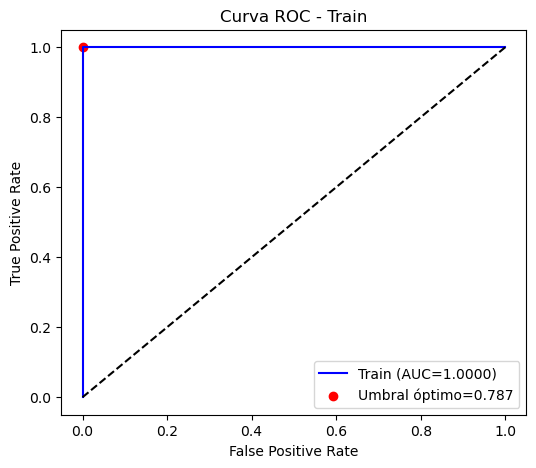

C:\Users\erika\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning:

X does not have valid feature names, but LGBMClassifier was fitted with feature names

C:\Users\erika\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning:

X does not have valid feature names, but LGBMClassifier was fitted with feature names




=== Resultados en Test (umbral = 0.5) ===
Accuracy:      0.8252
Sensibilidad:  0.8826
Especificidad: 0.7014
AUC:           0.8723

--- Calibración Youden J ---
Umbral óptimo:          0.6015
Sensibilidad óptima:    0.8690
Especificidad óptima:   0.7285

=== Resultados en Test (umbral óptimo) ===
Accuracy:      0.8245
Sensibilidad:  0.8690
Especificidad: 0.7285


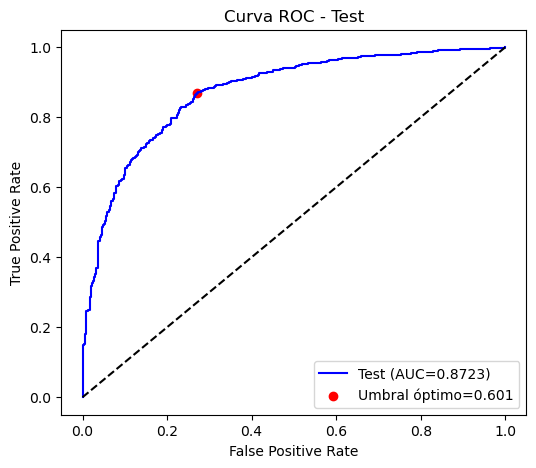

In [48]:
#Evaluación del rendimiento
evaluate_model(random_search_lgbm, X_train, y_train, "Train")
evaluate_model(random_search_lgbm, X_test, y_test, "Test")

#### Evaluacion de los modelos
XGBoost es el mejor modelo para los vinos blancos:

1.  En comparación con LGBM no presenta sobre ajuste.
2.  Obtiene un Accuracy de (78%) en el conjunto de prueba tras ajustar el umbral.
3.  XGBoost tiene una fiabilidad del 88% para detectar positivos el cuál es el interés de la compañia.

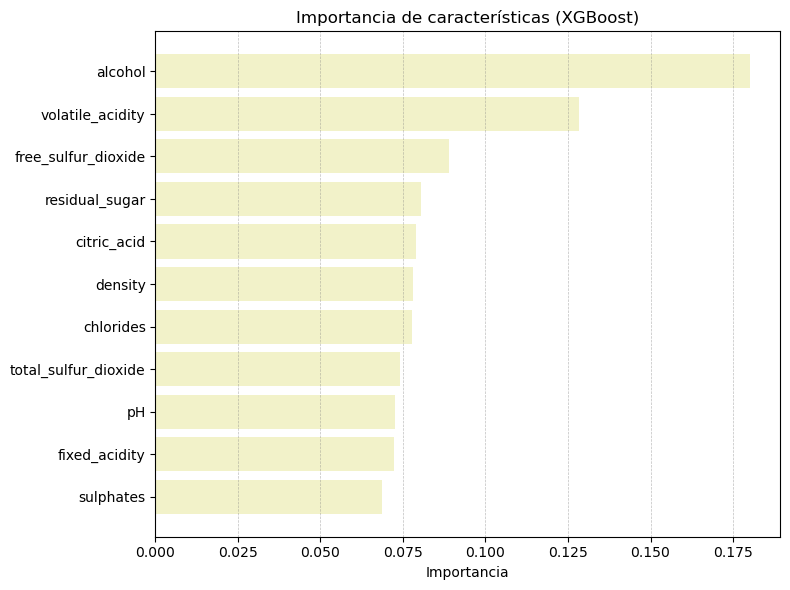

In [51]:
# Importancia de los atributos desde el paso "xgb"
importances = best_model_XGB.named_steps["xgb"].feature_importances_

# Ordenar de mayor a menor
idx = np.argsort(importances)[::-1]

# Valores ordenados
sorted_importances = importances[idx]
sorted_features = np.array(X.columns)[idx]

# Gráfico
plt.figure(figsize=(8,6))
plt.barh(range(len(sorted_importances)), sorted_importances, color="#F2F2C9")
plt.yticks(range(len(sorted_importances)), sorted_features)

# Grid gris vertical
plt.grid(axis="x", color="gray", linestyle="--", linewidth=0.5, alpha=0.5)

plt.xlabel("Importancia")
plt.title("Importancia de características (XGBoost)")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

#### Se importa modelo XGBoost en joblib

In [52]:
import joblib

# Modelo en formato joblib
joblib.dump(best_model_XGB, "modelo_xgb_blancos.joblib")

['modelo_xgb_blancos.joblib']

In [53]:
# Carga del modelo
xgb_model = joblib.load("modelo_xgb_blancos.joblib")